<div style="padding:20px;color:white;margin:0;font-size:300%;text-align:center;display:fill;border-radius:5px;background-color:rgb(250,100,100);overflow:hidden;font-weight:800">Superstore Dataset</div>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/superstore-sales-dataset/SuperStoreOrders.csv


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>1  |  About Dataset</div></b>


Context

With growing demands and cut-throat competitions in the market, a Superstore Giant is seeking your knowledge in understanding what works best for them. They would like to understand which products, regions, categories and customer segments they should target or avoid.

You can even take this a step further and try and build a Regression model to predict Sales or Profit.

Go crazy with the dataset, but also make sure to provide some business insights to improve.

Metadata

Row ID => Unique ID for each row.

Order ID => Unique Order ID for each Customer.

Order Date => Order Date of the product.

Ship Date => Shipping Date of the Product.

Ship Mode=> Shipping Mode specified by the Customer.

Customer ID => Unique ID to identify each Customer.

Customer Name => Name of the Customer.

Segment => The segment where the Customer belongs.

Country => Country of residence of the Customer.

City => City of residence of of the Customer.

State => State of residence of the Customer.

Postal Code => Postal Code of every Customer.

Region => Region where the Customer belong.

Product ID => Unique ID of the Product.

Category => Category of the product ordered.

Sub-Category => Sub-Category of the product ordered.

Product Name => Name of the Product

Sales => Sales of the Product.

Quantity => Quantity of the Product.

Discount => Discount provided.

Profit => Profit/Loss incurred.


Acknowledgements

I do not own this data. I merely found it from the Tableau website. All credits to the original authors/creators. For educational purposes only.

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>2  |  Libraries</div></b>

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline 
import seaborn as sns
import datetime
import scipy.stats as stats
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo 
import plotly.io as pio


import warnings
warnings.filterwarnings('ignore')

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>3  |  Dataset</div></b>


In [3]:
df=pd.read_csv('/kaggle/input/superstore-sales-dataset/SuperStoreOrders.csv',encoding='ISO-8859-1')

In [4]:
print("SuperStoreOrders contains", df.shape[0], "rows and", df.shape[1], "columns.")
df.head(3).T

SuperStoreOrders contains 51290 rows and 21 columns.


,0,1,2
ï»¿order_id,AG-2011-2040,IN-2011-47883,HU-2011-1220
order_date,1/1/2011,1/1/2011,1/1/2011
ship_date,6/1/2011,8/1/2011,5/1/2011
ship_mode,Standard Class,Standard Class,Second Class
customer_name,Toby Braunhardt,Joseph Holt,Annie Thurman
segment,Consumer,Consumer,Consumer
state,Constantine,New South Wales,Budapest
country,Algeria,Australia,Hungary
market,Africa,APAC,EMEA
region,Africa,Oceania,EMEA


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51290 entries, 0 to 51289
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ï»¿order_id     51290 non-null  object 
 1   order_date      51290 non-null  object 
 2   ship_date       51290 non-null  object 
 3   ship_mode       51290 non-null  object 
 4   customer_name   51290 non-null  object 
 5   segment         51290 non-null  object 
 6   state           51290 non-null  object 
 7   country         51290 non-null  object 
 8   market          51290 non-null  object 
 9   region          51290 non-null  object 
 10  product_id      51290 non-null  object 
 11  category        51290 non-null  object 
 12  sub_category    51290 non-null  object 
 13  product_name    51290 non-null  object 
 14  sales           51290 non-null  object 
 15  quantity        51290 non-null  int64  
 16  discount        51290 non-null  float64
 17  profit          51290 non-null 

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>4  |  Inspecting and Cleaning Dataframe Structure</div></b>


In [6]:
# Fixing column name 'order_id'
# Corrigindo o nome da coluna 'order_id'

df = df.rename(columns={"ï»¿order_id":"order_id"})

In [7]:
# Change columns to type 'datetime'
# Alterar colunas para tipo 'datetime'

df['order_date']=pd.to_datetime(df['order_date'])
df['ship_date']=pd.to_datetime(df['ship_date'])

In [8]:
# Create columns for year, month and day
# Criar colunas para ano, mês e dia

df['OrderY']=df['order_date'].dt.year
df['OrderM']=df['order_date'].dt.month
df['OrderD']=df['order_date'].dt.day

In [9]:
# Fixing 'sales' column from object to int
# Corrigindo coluna 'sales' de object para int

df['sales'] = df['sales'].replace({',': ''}, regex=True)
df['sales'] = df['sales'].astype(int)


In [10]:
# Create column 'Profitability'
# Criar coluna 'Profitability'

df['Profitability']=df['profit']/df['sales']

In [11]:
df.head()

,order_id,order_date,ship_date,ship_mode,customer_name,segment,state,country,market,region,...,quantity,discount,profit,shipping_cost,order_priority,year,OrderY,OrderM,OrderD,Profitability
0,AG-2011-2040,2011-01-01,2011-06-01,Standard Class,Toby Braunhardt,Consumer,Constantine,Algeria,Africa,Africa,...,2,0.0,106.140,35.46,Medium,2011,2011,1,1,0.260147
1,IN-2011-47883,2011-01-01,2011-08-01,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,...,3,0.1,36.036,9.72,Medium,2011,2011,1,1,0.300300
2,HU-2011-1220,2011-01-01,2011-05-01,Second Class,Annie Thurman,Consumer,Budapest,Hungary,EMEA,EMEA,...,4,0.0,29.640,8.17,High,2011,2011,1,1,0.449091
3,IT-2011-3647632,2011-01-01,2011-05-01,Second Class,Eugene Moren,Home Office,Stockholm,Sweden,EU,North,...,3,0.5,-26.055,4.82,High,2011,2011,1,1,-0.579000
4,IN-2011-47883,2011-01-01,2011-08-01,Standard Class,Joseph Holt,Consumer,New South Wales,Australia,APAC,Oceania,...,5,0.1,37.770,4.70,Medium,2011,2011,1,1,0.331316


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>5  |  Region</div></b>

In [12]:
# Set figure size and style
plt.figure(figsize=(20, 20))
sns.set_style('darkgrid')
palette = sns.color_palette('deep', n_colors=6)

fig = px.pie(df,
             names='region',
             values='sales',
             title='Sales X Segment',
             labels={'sales': 'regiom'},
             hole=0.4)


fig.update_traces(textposition='inside', textinfo='percent+label')
plt.tight_layout()

# Show the chart
fig.show()

<Figure size 1440x1440 with 0 Axes>

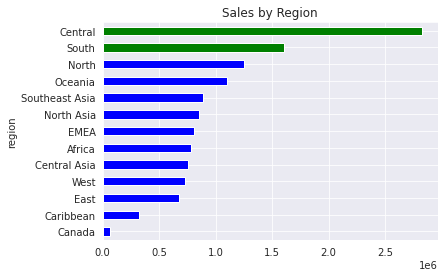

In [13]:
# Sales by Region
# Vendas por Região

colors = ['blue', 'blue','blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('region')['sales'].sum().sort_values(ascending=True).tail(13).plot.barh(color=colors);
plt.title("Sales by Region") 
plt.show()

In [14]:
# Top 5 Sales by Region
sum_region = df.groupby('region')['sales'].sum().reset_index()
sum_region = sum_region.sort_values(by='sales', ascending=False)

top_5 = sum_region.head(5)
fig = go.Figure()
fig.add_trace(go.Bar(x=top_5['region'], y=top_5['sales']))

fig.update_layout(title='Top 5 Region by Sales',
                  xaxis_title='Region',
                  yaxis_title='Sales',
                  plot_bgcolor='black', 
                  paper_bgcolor='#595964',  
                  font=dict(color='white'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

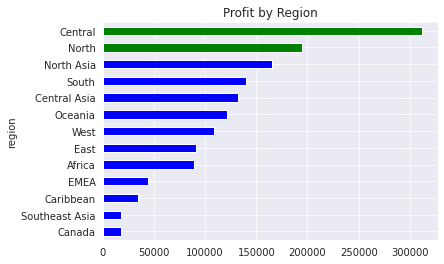

In [15]:
# Profit by Region
# Lucro por Região

colors = ['blue', 'blue','blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('region')['profit'].sum().sort_values(ascending=True).tail(13).plot.barh(color=colors);
plt.title("Profit by Region") 
plt.show()

In [16]:
# Top 5 Profit by Region
sum_region = df.groupby('region')['profit'].sum().reset_index()
sum_region = sum_region.sort_values(by='profit', ascending=False)

top_5 = sum_region.head(5)
fig = go.Figure()
fig.add_trace(go.Bar(x=top_5['region'], y=top_5['profit']))

fig.update_layout(title='Top 5 Region by Profit',
                  xaxis_title='Region',
                  yaxis_title='Profit',
                  plot_bgcolor='black', 
                  paper_bgcolor='#595964',  
                  font=dict(color='white'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

In [17]:
# Create dataframe for Central and North region
# Criar dataframe para a região Central e North

df_cen=df[df['region']=='Central']
df_nor=df[df['region']=='North']

### <b><span style='color:#DEB078'>5.1 |</span><span style='color:rgb(250,100,100)'> Central Region</span></b>  


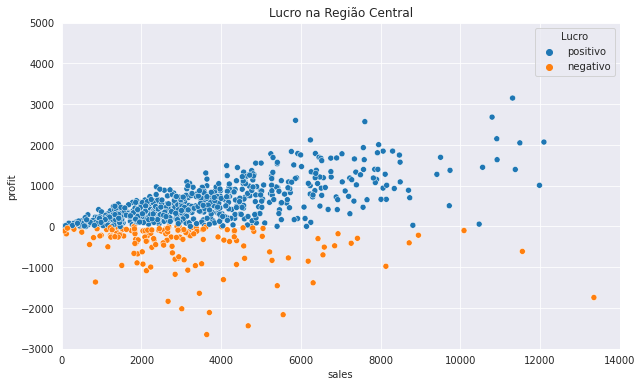

In [18]:
# Distribution of sales and profits by customers in the Central region
# Distribuição de vendas e lucros por clientes da região Central

df_cen_customer=pd.DataFrame(df_cen.groupby('customer_name')['sales'].sum())
df_cen_customer['profit']=pd.DataFrame(df_cen.groupby('customer_name')['profit'].sum())

def type(ex):
    if ex <0:
        return 'negativo'
    else:
        return 'positivo'

df_cen_customer.loc[:,'Lucro']=df_cen_customer.loc[:,'profit'].apply(type)

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df_cen_customer, hue='Lucro',x='sales',y='profit')
plt.title("Lucro na Região Central") 
plt.xlim(0, 14000)
plt.ylim(-3000, 5000)
plt.show()

### <b><span style='color:#DEB078'>5.2 |</span><span style='color:rgb(250,100,100)'> North Region</span></b>  

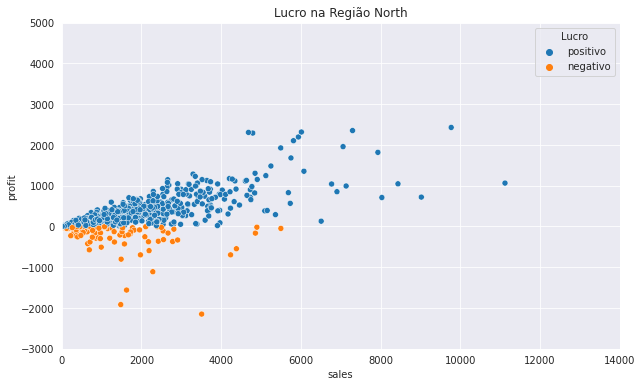

In [19]:
# Distribution of sales and profits by customers in the North region
# Distribuição de vendas e lucros por clientes da região North

df_nor_customer=pd.DataFrame(df_nor.groupby('customer_name')['sales'].sum())
df_nor_customer['profit']=pd.DataFrame(df_nor.groupby('customer_name')['profit'].sum())

def type(ex):
    if ex <0:
        return 'negativo'
    else:
        return 'positivo'

df_nor_customer.loc[:,'Lucro']=df_nor_customer.loc[:,'profit'].apply(type)

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df_nor_customer, hue='Lucro',x='sales',y='profit')
plt.title("Lucro na Região North") 
plt.xlim(0, 14000)
plt.ylim(-3000, 5000)
plt.show()

## Analyze:

**Central Region has the highest volume of sales and profits.**

**Região Central tem o volume maior de vendas e lucros.**

### <b><span style='color:#DEB078'>5.3 |</span><span style='color:rgb(250,100,100)'> Main Customers in the Central Region</span></b>  


In [20]:
df_cen_customer.sort_values(by=['sales'],ascending=False).head()

,sales,profit,Lucro
customer_name,,,
Tamara Chand,27345,7673.0585,positivo
Sanjit Chand,15673,6517.3185,positivo
Adrian Barton,14258,5741.3215,positivo
Harry Greene,14207,-1646.6299,negativo
Becky Martin,13353,-1741.8293,negativo


**Tamara Chand contributes the highest sales and highest profit in the Central region**

**Tamara Chand contribui com a maior venda e o maior lucro da região Central**

In [21]:
# Create dataframe for 'Region'
# Criar dataframe para 'Region'

df_reg = df[['region', 'sales', 'profit']]
df_region=pd.DataFrame(df_reg.groupby('region')['sales'].sum())
df_region['profit']=pd.DataFrame(df_reg.groupby('region')['profit'].sum())
df_region['% Profitability']=df_region['profit']/df_region['sales'] * 100
df_region.sort_values(by='% Profitability', axis=0, ascending=False, inplace=True)
df_region

,sales,profit,% Profitability
region,,,
Canada,66932,17817.39000,26.620137
North Asia,848349,165578.42100,19.517725
Central Asia,752839,132480.18700,17.597413
North,1248192,194597.95252,15.590386
West,725514,108418.44890,14.943674
East,678834,91522.78000,13.482351
Africa,783776,88871.63100,11.338907
Oceania,1100207,121666.64200,11.058523
Central,2822399,311403.98164,11.033308



## Analyze:

**The regions with the highest profitability are 'Canada', 'North Asia' and 'North'.**

**As regiões com maiores lucratividade são 'Canada', 'North Asia' e 'North'.**

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>6  |  Country</div></b>

In [22]:
# highest Sales according to Country

import plotly.express as px

df_city = pd.DataFrame(df.groupby('country')[['country','sales']].sum().sort_values('sales', ascending=False).round(2).head(10))
fig = px.bar(df_city, x = df_city.index, y = 'sales',
            title = 'highest Sales according to Country', template = 'seaborn', color = df_city.index, text = 'sales')
fig.show()
df_city

,sales
country,
United States,2297354
Australia,925257
France,858930
China,700591
Germany,628857
Mexico,622620
India,589664
United Kingdom,528570
Indonesia,404887


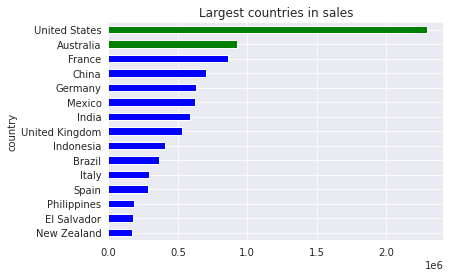

In [23]:
# Largest countries in sales
# Maiores países em vendas

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('country')['sales'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Largest countries in sales") 
plt.show()

In [24]:
# Top 5 Country by Sales
sum_country = df.groupby('country')['sales'].sum().reset_index()
sum_country = sum_country.sort_values(by='sales', ascending=False)

top_5 = sum_country.head(5)
fig = go.Figure()
fig.add_trace(go.Bar(x=top_5['country'], y=top_5['sales']))

fig.update_layout(title='Top 5 Country by Sales',
                  xaxis_title='Country',
                  yaxis_title='Sales',
                  plot_bgcolor='black', 
                  paper_bgcolor='#595964',  
                  font=dict(color='white'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

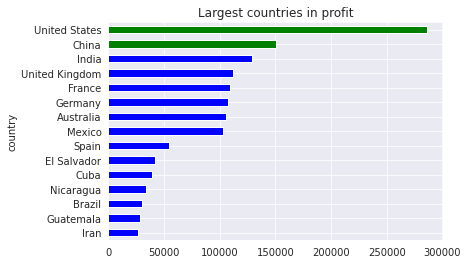

In [25]:
# Largest countries in profit
# Maiores países em lucros

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('country')['profit'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Largest countries in profit") 
plt.show()

In [26]:
# Top 5 Country by profit
sum_country = df.groupby('country')['profit'].sum().reset_index()
sum_country = sum_country.sort_values(by='profit', ascending=False)

top_5 = sum_country.head(5)
fig = go.Figure()
fig.add_trace(go.Bar(x=top_5['country'], y=top_5['profit']))

fig.update_layout(title='Top 5 Country by profit',
                  xaxis_title='Country',
                  yaxis_title='profit',
                  plot_bgcolor='black', 
                  paper_bgcolor='#595964',  
                  font=dict(color='white'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

In [27]:
# Create dataframe for Country
# Criar dataframe para Country

df_cou = df[['country', 'sales', 'profit']]
df_coun=pd.DataFrame(df_cou.groupby('country')['sales'].sum())
df_coun['profit']=pd.DataFrame(df_cou.groupby('country')['profit'].sum())
df_coun['% Profitability']=df_coun['profit']/df_coun['sales'] * 100
df_coun.sort_values(by='% Profitability', axis=0, ascending=False, inplace=True)
df_coun

,sales,profit,% Profitability
country,,,
Armenia,156,69.090,44.288462
Mauritania,4020,1675.950,41.690299
Eritrea,188,76.200,40.531915
Slovenia,1469,590.040,40.166099
Burundi,268,103.080,38.462687
...,...,...,...
Nigeria,54347,-80750.718,-148.583580
Uganda,1625,-2426.085,-149.297538
Yemen,2464,-3706.458,-150.424432


## Analyze:

**The United States is the biggest country in sales and profit, but 'Armenia', 'Mauritania' and 'Eritrea' show higher profitability**

**The United States são o maior país em vendas e em lucro, mas 'Armenia', 'Mauritania' e 'Eritrea' apresentam maior lucratividade**

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>7  |  State - US</div></b>

In [28]:
# Create dataframe for US
# Criar dataframe dos US

df_usa = df.loc[df['country'] == 'United States']

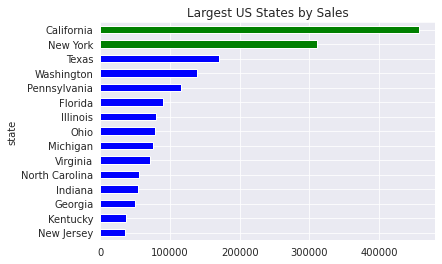

In [29]:
# Largest US States by Sales
# Maiores Estados dos USA em Vendas

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df_usa.groupby('state')['sales'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Largest US States by Sales") 
plt.show()

In [30]:
# Top 5 State by Sales
sum_state = df_usa.groupby('state')['sales'].sum().reset_index()
sum_state = sum_state.sort_values(by='sales', ascending=False)

top_5 = sum_state.head(5)
fig = go.Figure()
fig.add_trace(go.Bar(x=top_5['state'], y=top_5['sales']))

fig.update_layout(title='Top 5 State by Sales',
                  xaxis_title='State',
                  yaxis_title='Sales',
                  plot_bgcolor='black', 
                  paper_bgcolor='#595964',  
                  font=dict(color='white'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

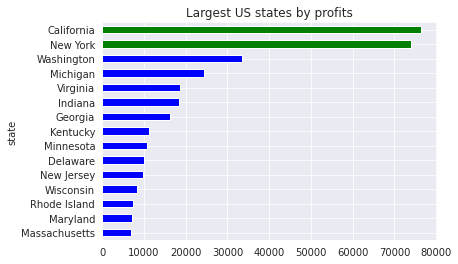

In [31]:
# Largest US states by profits
# Maiores Estados dos USA em lucros

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df_usa.groupby('state')['profit'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Largest US states by profits") 
plt.show()

In [32]:
# Top 5 State by Profit
sum_state = df_usa.groupby('state')['profit'].sum().reset_index()
sum_state = sum_state.sort_values(by='profit', ascending=False)

top_5 = sum_state.head(5)
fig = go.Figure()
fig.add_trace(go.Bar(x=top_5['state'], y=top_5['profit']))

fig.update_layout(title='Top 5 State by Profit',
                  xaxis_title='State',
                  yaxis_title='profit',
                  plot_bgcolor='black', 
                  paper_bgcolor='#595964',  
                  font=dict(color='white'))

pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)

In [33]:
# Create dataframe for State
# Criar dataframe para State

df_st = df_usa[['state', 'sales', 'profit']]
df_sta=pd.DataFrame(df_st.groupby('state')['sales'].sum())
df_sta['profit']=pd.DataFrame(df_st.groupby('state')['profit'].sum())
df_sta['% Profitability']=df_sta['profit']/df_sta['sales'] * 100
df_sta.sort_values(by='% Profitability', axis=0, ascending=False, inplace=True)
df_sta

,sales,profit,% Profitability
state,,,
District of Columbia,2866,1059.5893,36.971015
Delaware,27453,9977.3748,36.343477
Minnesota,29865,10823.1874,36.240373
Maine,1270,454.4862,35.786315
Indiana,53549,18382.9363,34.329187
Arkansas,11678,4008.6871,34.326829
Georgia,49103,16250.0433,33.093789
Montana,5589,1833.3285,32.802442
Rhode Island,22629,7285.6293,32.195984


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>8  |  Customer</div></b>

### <b><span style='color:#DEB078'>8.1 |</span><span style='color:rgb(250,100,100)'> Top 15 Customers</span></b>  


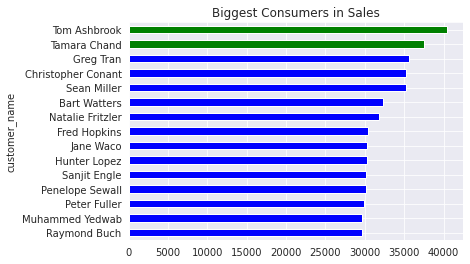

In [34]:
# Biggest Consumers in Sales
# Maiores Consumidores em Vendas

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('customer_name')['sales'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Biggest Consumers in Sales") 
plt.show()

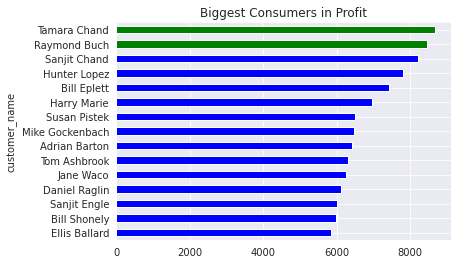

In [35]:
# Biggest Consumers in Profit
# Maiores Consumidores em Lucro

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('customer_name')['profit'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Biggest Consumers in Profit") 
plt.show()

## Analyze:

**The biggest Profit client is Tamara Chand, so let's take a closer look at this client**

**A maior cliente em Lucro é a Tamara Chand, por isso vamos analisar melhor esta cliente**

### <b><span style='color:#DEB078'>8.2 |</span><span style='color:rgb(250,100,100)'> Top Customer - Tamara Chand</span></b>  


In [36]:
# Create dataframe of the highest Profit Client = Tamara Chand
# Criar dataframe da maior Cliente em Lucro = Tamara Chand 

df_tam = df.loc[df['customer_name'] == 'Tamara Chand']

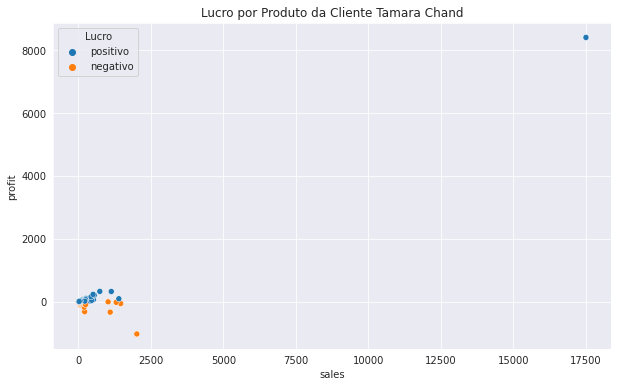

In [37]:
# Profit per Product from sales for customer Tamara Chand
# Lucro por Produto das vendas para a cliente Tamara Chand

df_tam_pro=pd.DataFrame(df_tam.groupby('product_name')['sales'].sum())
df_tam_pro['profit']=pd.DataFrame(df_tam.groupby('product_name')['profit'].sum())

def type(ex):
    if ex <0:
        return 'negativo'
    else:
        return 'positivo'

df_tam_pro.loc[:,'Lucro']=df_tam_pro.loc[:,'profit'].apply(type)

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df_tam_pro, hue='Lucro',x='sales',y='profit')
plt.title("Lucro por Produto da Cliente Tamara Chand") 
plt.show()

In [38]:
# Sales for the client Tamara Chand
# Vendas para a cliente Tamara Chand

df_tam_pro.sort_values(by='profit', ascending=False)

,sales,profit,Lucro
product_name,,,
Canon imageCLASS 2200 Advanced Copier,17500,8399.976,positivo
Ibico Ibimaster 300 Manual Binding System,736,331.191,positivo
"Brother Wireless Fax, High-Speed",1131,327.960,positivo
"Sharp Ink, Color",503,236.520,positivo
"Office Star Chairmat, Adjustable",546,213.120,positivo
...,...,...,...
"Hon Swivel Stool, Adjustable",50,-94.728,negativo
"Cisco Smart Phone, with Caller ID",196,-170.118,negativo
"Advantus Photo Frame, Black",212,-312.780,negativo


## Analyze:

**We can verify that there are sales with profit and loss, but we noticed a single sale of expressive value and with high profit. This single sale makes Tamara Chand the top Profit Customer.**

**Podemos verificar que existem vendas com lucro e prejuízo, porém notamos uma única venda de valor expressivo e com alto lucro. Essa única venda faz com que a Tamara Chand seja a maior Cliente em Lucros.**

In [39]:
# Detailed sales analysis for Tamara Chand
# Análise detalhada das vendas para a cliente Tamara Chand

df_tam = df_tam.drop(['discount', 'year', 'OrderY', 'OrderM', 'OrderD', 'Profitability'], axis=1)
df_tam.groupby(['country','category','ship_mode']).sum().round(2)

sales  quantity   profit  \
country        category        ship_mode                                  
Australia      Office Supplies First Class        53         2    18.27   
                               Standard Class    352         8    46.82   
               Technology      First Class       101         2    14.04   
Austria        Furniture       Standard Class    666         8   202.32   
Azerbaijan     Furniture       Same Day          455         1    50.01   
               Office Supplies Same Day           41         2    17.94   
               Technology      Same Day           96         2    12.42   
Brazil         Furniture       Standard Class   1687         8   -15.19   
               Office Supplies Standard Class     39         2    19.68   
               Technology      Standard Class     76         2    11.36   
China          Furniture       Standard Class    676        11   133.62   
               Technology      Standard Class   1131         3   327.96   
Colombia       Technology      Standard Class    170         3    15.24   
El Salvador    Office Supplies Second Class      159         9    39.60   
France         Furniture       First Class      2115         8 -1009.37   
               Office Supplies Standard Class    212         6    -2.35   
               Technology      First Class       328         3    19.30   
                               Standard Class   1414        11    -7.60   
Germany        Furniture       Standard Class    126         3    63.09   
               Office Supplies Standard Class     51         5    10.20   
               Technology      Standard Class    513         4    66.72   
Guatemala      Office Supplies Standard Class    495         9    79.60   
Honduras       Furniture       Standard Class   1093         6  -328.03   
               Office Supplies Standard Class    509        17  -188.02   
               Technology      Standard Class   1084         8   -26.59   
India          Furniture       Same Day           48         2    19.50   
                               Standard Class   1392         3    97.38   
               Office Supplies Standard Class     72         4    26.04   
Malaysia       Office Supplies First Class        14         1     0.54   
Mexico         Office Supplies First Class        20         1     9.20   
                               Standard Class     16         3     5.88   
Nigeria        Furniture       Same Day          103         3  -150.46   
               Office Supplies Same Day          153        15  -167.74   
               Technology      Same Day          232         2  -222.37   
Panama         Technology      Second Class      144         3     9.12   
Qatar          Furniture       Standard Class    602         9   230.01   
               Office Supplies Standard Class    219         4    21.84   
               Technology      Standard Class    239         2    73.98   
Saudi Arabia   Office Supplies Standard Class     12         1     3.90   
Slovenia       Office Supplies Standard Class    153         2    50.58   
South Africa   Furniture       Standard Class     99         2    30.42   
Spain          Office Supplies Standard Class    196         4    62.46   
Turkey         Furniture       Standard Class    212        10  -312.78   
Ukraine        Office Supplies First Class        38         2     0.72   
               Technology      First Class       583         5   246.96   
United Kingdom Office Supplies Second Class      214         8    85.35   
United States  Office Supplies First Class       100         6   -17.33   
                               Standard Class    952        26   414.41   
               Technology      Standard Class  17998        10  8584.24   

                                               shipping_cost  
country        category        ship_mode                      
Australia      Office Supplies First Class              6.18  
                               S

### <b><span style='color:#DEB078'>8.3 |</span><span style='color:rgb(250,100,100)'> Pareto Principle</span></b>  

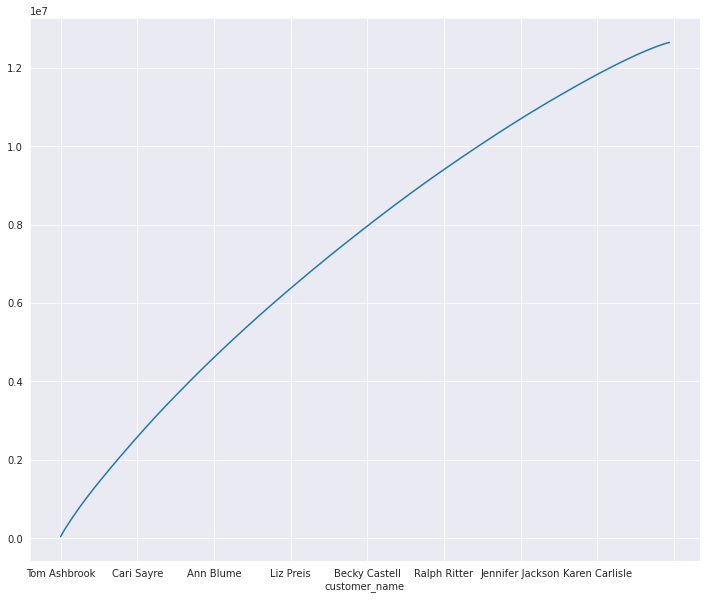

In [40]:
# Cumulative curve in Consumer Sales
# Curva cumulativa em Vendas dos Consumidores

plt.figure(figsize=(12,10))
df.groupby('customer_name')['sales'].sum().sort_values(ascending=False).cumsum().plot();

In [41]:
df1=pd.DataFrame(df.groupby('customer_name')['sales'].sum().sort_values(ascending=False))

In [42]:
df1.quantile(0.7, interpolation='higher')

sales    17959
Name: 0.7, dtype: int64

In [43]:
df1[df1['sales']>=17959].sum()/df['sales'].sum()

sales    0.419737
dtype: float64

#### Top 30% of consumers occupy 42% of Sales. Therefore, the Pareto Law does not apply
#### Maiores 30% dos consumidores ocupam 42% das Vendas. Logo NÃO se aplica a Lei de Pareto

### <b><span style='color:#DEB078'>8.4 |</span><span style='color:rgb(250,100,100)'> Cumulative Curve - Customer Profit</span></b>  

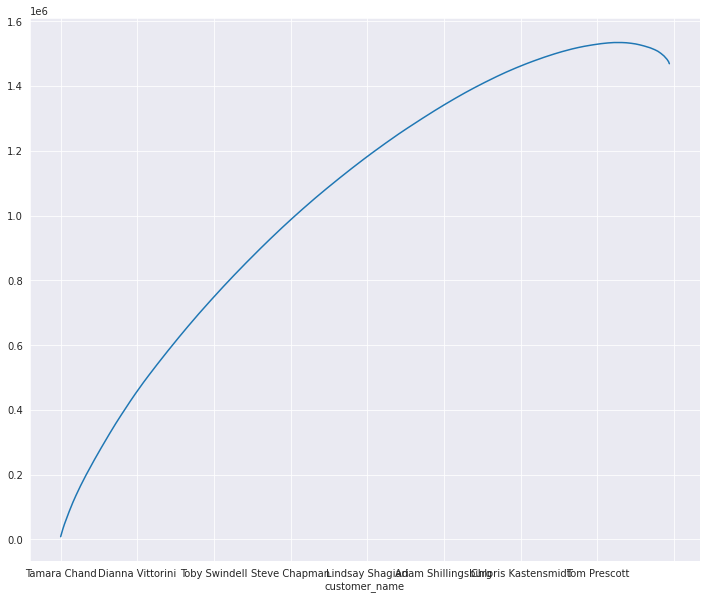

In [44]:
# Cumulative curve in Consumer Profit
# Curva cumulativa em Lucro dos Consumidores

plt.figure(figsize=(12,10))
df.groupby('customer_name')['profit'].sum().sort_values(ascending=False).cumsum().plot();

In [45]:
df2=pd.DataFrame(df.groupby('customer_name')['profit'].sum().sort_values(ascending=False))

In [46]:
df2.quantile(0.7, interpolation='higher')

profit    2436.066
Name: 0.7, dtype: float64

In [47]:
df2[df2['profit']>=2436.066].sum()/df['profit'].sum()

profit    0.575065
dtype: float64

#### Top 30% of consumers occupy 57% of Profits. Therefore, the Pareto Law does not apply
#### Maiores 30% dos consumidores ocupam 57% dos Lucros. Logo NÃO se aplica a Lei de Pareto

### <b><span style='color:#DEB078'>8.5 |</span><span style='color:rgb(250,100,100)'> Analysis of profit per consumer</span></b>  


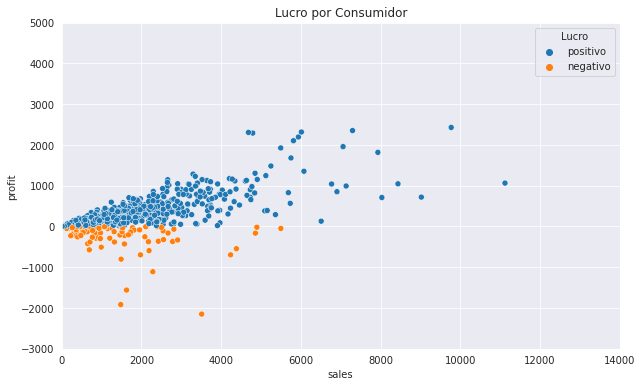

In [48]:
# Profit per Consumer
# Lucro por Consumidor

df_customer=pd.DataFrame(df_nor.groupby('customer_name')['sales'].sum())
df_customer['profit']=pd.DataFrame(df_nor.groupby('customer_name')['profit'].sum())

def type(ex):
    if ex <0:
        return 'negativo'
    else:
        return 'positivo'

df_customer.loc[:,'Lucro']=df_customer.loc[:,'profit'].apply(type)

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df_customer, hue='Lucro',x='sales',y='profit')
plt.title("Lucro por Consumidor") 
plt.xlim(0, 14000)
plt.ylim(-3000, 5000)
plt.show()


## Analyze:

**We can see that the biggest buyers have positive profit. This is excellent.**

**Podemos ver que os maiores compradores tem lucro positivo. Isso é excelente.**

In [49]:
# Create dataframe for State
# Criar dataframe para State

df_cus = df[['customer_name', 'sales', 'profit']]
df_cust=pd.DataFrame(df_cus.groupby('customer_name')['sales'].sum())
df_cust['profit']=pd.DataFrame(df_cus.groupby('customer_name')['profit'].sum())
df_cust['% Profitability']=df_cust['profit']/df_cust['sales'] * 100
df_cust.sort_values(by='% Profitability', axis=0, ascending=False, inplace=True)
df_cust

,sales,profit,% Profitability
customer_name,,,
Andy Reiter,8545,3139.08330,36.735908
Sanjit Chand,26524,8205.37990,30.935681
Raymond Buch,29601,8453.04950,28.556635
Patrick Jones,14442,4019.13250,27.829473
Mike Gockenbach,23378,6458.67620,27.627155
...,...,...,...
Candace McMahon,14798,-2798.79060,-18.913303
Sharelle Roach,13005,-2551.18846,-19.616982
Luke Foster,13422,-3644.34750,-27.152045


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>9  |  Category</div></b>

In [50]:
# Set figure size and style
plt.figure(figsize=(10, 10))
sns.set_style('darkgrid')
palette = sns.color_palette('deep', n_colors=6)

fig = px.pie(df,
             names='category',
             values='sales',
             title='Sales X Category',
             labels={'sales': 'category'},
             hole=0.3)


fig.update_traces(textposition='inside', textinfo='percent+label')
plt.tight_layout()

# Show the chart
fig.show()

<Figure size 720x720 with 0 Axes>

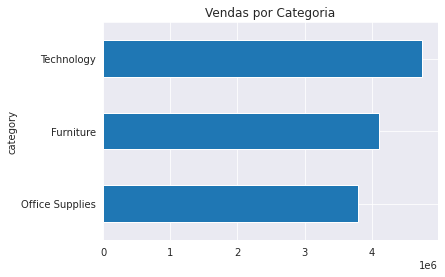

In [51]:
# Sales by Category
# Vendas por Categoria

df.groupby('category')['sales'].sum().sort_values(ascending=True).plot.barh();
plt.title("Vendas por Categoria") 
plt.show()

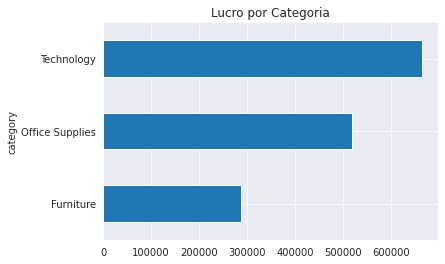

In [52]:
# Profit by Category
# Lucro por Categoria

df.groupby('category')['profit'].sum().sort_values(ascending=True).plot.barh();
plt.title("Lucro por Categoria") 
plt.show()

In [53]:
df_category=pd.DataFrame(df.groupby('category')['sales'].sum())
df_category['profit']=pd.DataFrame(df.groupby('category')['profit'].sum())
df_category['% profit']= df_category['profit'] / df_category['sales'] * 100

In [54]:
df_category

,sales,profit,% profit
category,,,
Furniture,4110884,286782.25380,6.976170
Office Supplies,3787330,518473.83430,13.689693
Technology,4744691,663778.73318,13.989925


#### Analyze:

**The 'Technology' category has the highest profitability, both in value and percentage.**

**A categoria 'Tecnology' tem a maior lucratividade, tanto em valor, quanto em percentagem.**

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>10  |  Sub-Category</div></b>

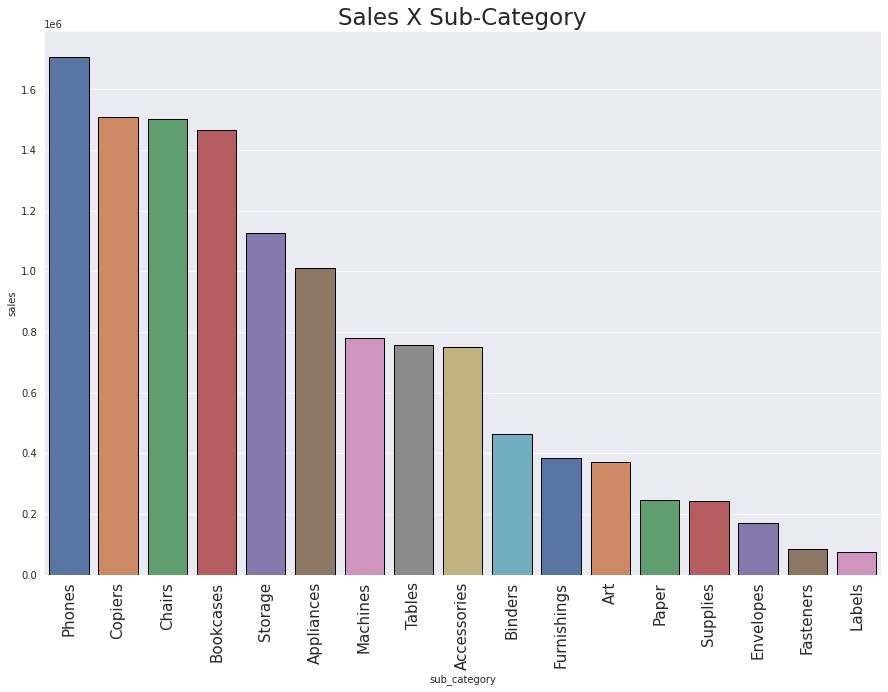

In [55]:
plt.figure(figsize=(15,10))
sns.set_style('darkgrid')
sns.barplot(x='sub_category', y='sales', data=df.groupby('sub_category').sum().sort_values('sales', ascending=False).reset_index(), ci=None, palette='deep',linewidth=1,edgecolor='black')
plt.title('Sales X Sub-Category', fontsize=23)
plt.xticks(fontsize=15, rotation=90)
plt.show()

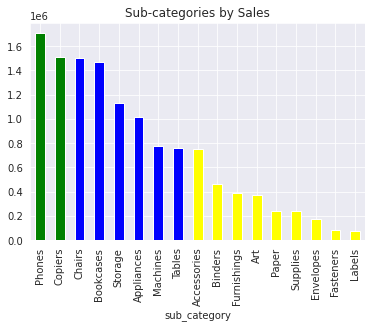

In [56]:
# Sub-categories by Sales
# Sub-categorias por Vendas

colors = ['green', 'green', 'blue', 'blue','blue','blue','blue','blue','yellow','yellow',
         'yellow', 'yellow', 'yellow', 'yellow','yellow','yellow','yellow']
df.groupby('sub_category')['sales'].sum().sort_values(ascending=False).plot.bar(color=colors);
plt.title("Sub-categories by Sales") 
plt.show()

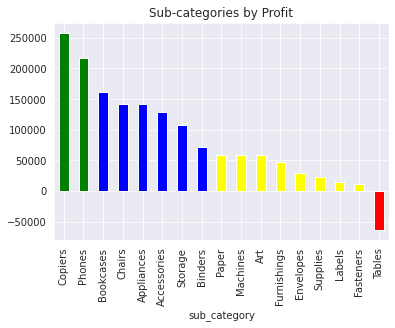

In [57]:
# Sub-categories by Profit
# Sub-categorias por Lucro

colors = ['green', 'green', 'blue', 'blue','blue','blue','blue','blue','yellow','yellow',
         'yellow', 'yellow', 'yellow', 'yellow','yellow','yellow','red']
df.groupby('sub_category')['profit'].sum().sort_values(ascending=False).plot.bar(color=colors);
plt.title("Sub-categories by Profit") 
plt.show()

### <b><span style='color:#DEB078'>10.1 |</span><span style='color:rgb(250,100,100)'> Profit from Sub-Categories</span></b>  

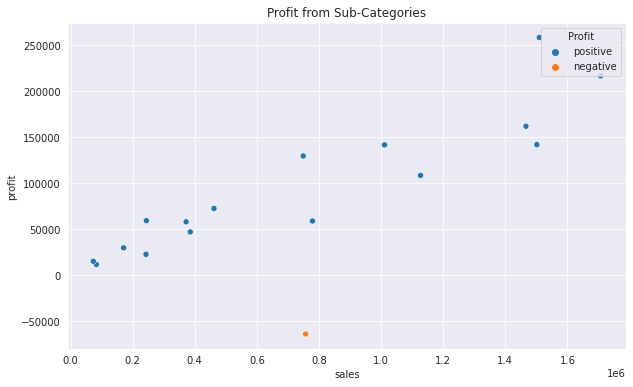

In [58]:
# Profit from Sub-Categories
# Lucro das Sub-Categorias

df_sub=pd.DataFrame(df.groupby('sub_category')['sales'].sum())
df_sub['profit']=pd.DataFrame(df.groupby('sub_category')['profit'].sum())

def type(ex):
    if ex <0:
        return 'negative'
    else:
        return 'positive'

df_sub.loc[:,'Profit']=df_sub.loc[:,'profit'].apply(type)

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df_sub, hue='Profit',x='sales',y='profit')
plt.title("Profit from Sub-Categories") 

plt.show()

In [59]:
# Create dataframe for 'Sub-category'
# Criar dataframe para 'Sub-category'

df_su = df[['sub_category', 'sales', 'profit']]
df_sca=pd.DataFrame(df_su.groupby('sub_category')['sales'].sum())
df_sca['profit']=pd.DataFrame(df_su.groupby('sub_category')['profit'].sum())
df_sca['% Profitability']=df_sca['profit']/df_sca['sales'] * 100
df_sca.sort_values(by='% Profitability', axis=0, ascending=False, inplace=True)
df_sca

,sales,profit,% Profitability
sub_category,,,
Paper,244307,59207.68270,24.234951
Labels,73433,15010.51200,20.441099
Envelopes,170926,29601.11630,17.318089
Accessories,749307,129626.30620,17.299492
Copiers,1509439,258567.54818,17.130043
Binders,461952,72449.84600,15.683414
Art,372163,57953.91090,15.572185
Appliances,1011081,141680.58940,14.012783
Fasteners,83254,11525.42410,13.843688


## Analyze:

**We can see that the sub-category with the highest profit is 'Accessories' and the only category with a loss is 'Tables'.**

**Podemos verificar que a sub-categoria com maior lucro é 'Acessories' e a única categoria com prejuízo é 'Tables'.**

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>11  |  Product</div></b>

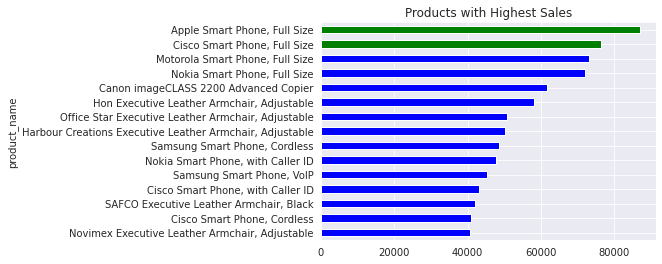

In [60]:
# Products with Highest Sales
# Produtos com Maiores Vendas

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('product_name')['sales'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Products with Highest Sales") 
plt.show()

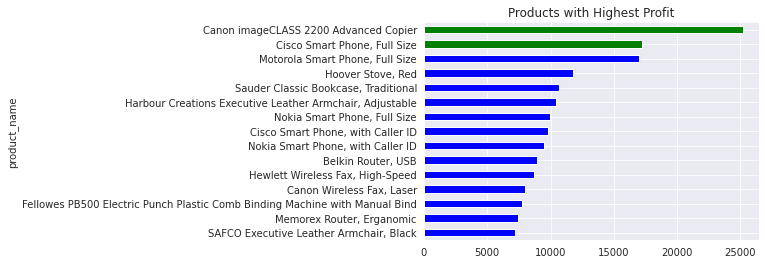

In [61]:
# Products with Highest Profit
# Produtos com Maiores Lucros

colors = ['blue', 'blue','blue', 'blue', 'blue',
         'blue', 'blue', 'blue', 'blue','blue','blue','blue','blue','green','green']
df.groupby('product_name')['profit'].sum().sort_values(ascending=True).tail(15).plot.barh(color=colors);
plt.title("Products with Highest Profit") 
plt.show()

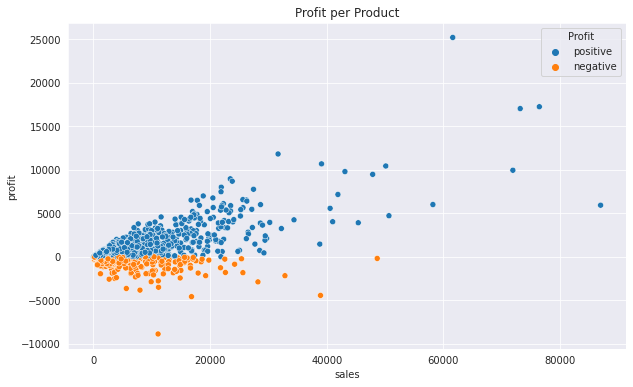

In [62]:
# Profit per Product
# Lucro por Produto

df_prod=pd.DataFrame(df.groupby('product_name')['sales'].sum())
df_prod['profit']=pd.DataFrame(df.groupby('product_name')['profit'].sum())

def type(ex):
    if ex <0:
        return 'negative'
    else:
        return 'positive'

df_prod.loc[:,'Profit']=df_prod.loc[:,'profit'].apply(type)

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df_prod, hue='Profit',x='sales',y='profit')
plt.title("Profit per Product") 
plt.show()

In [63]:
df_prod['Profit'].value_counts()

positive    3111
negative     677
Name: Profit, dtype: int64

## Analyze:

**We can see that 3111 products make a profit and 677 products make a loss.**

**Podemos ver que 3111 produtos dão lucro e 677 produtos dão prejuízo.**

In [64]:
# Products with Greater Profits and Greater Losses
# Produtos com Maiores Lucros e com Maiores Prejuízos

df_prod_profit_1 = df.groupby('product_name')['profit'].sum().sort_values(ascending=False)
print("Products with Greater Profits:", (df_prod_profit_1.head(3)), '\n')
print("Products with Greater Losses:", (df_prod_profit_1.tail(3)))

Products with Greater Profits: product_name
Canon imageCLASS 2200 Advanced Copier    25199.9280
Cisco Smart Phone, Full Size             17238.5206
Motorola Smart Phone, Full Size          17027.1130
Name: profit, dtype: float64 

Products with Greater Losses: product_name
Motorola Smart Phone, Cordless              -4447.0380
Lexmark MX611dhe Monochrome Laser Printer   -4589.9730
Cubify CubeX 3D Printer Double Head Print   -8879.9704
Name: profit, dtype: float64


In [65]:
# Create dataframe for 'Product'
# Criar dataframe para 'Product'

df_pr = df[['product_name', 'sales', 'profit']]
df_pro=pd.DataFrame(df_pr.groupby('product_name')['sales'].sum())
df_pro['profit']=pd.DataFrame(df_pr.groupby('product_name')['profit'].sum())
df_pro['% Profitability']=df_pro['profit']/df_pro['sales'] * 100
df_pro.sort_values(by='% Profitability', axis=0, ascending=False, inplace=True)
df_pro

,sales,profit,% Profitability
product_name,,,
Xerox 20,6,3.1104,51.840000
Avery 475,265,133.2000,50.264151
Canon imageCLASS MF7460 Monochrome Digital Laser Multifunction Copier,3992,1995.9900,49.999749
Xerox 1890,245,122.3500,49.938776
Tops Green Bar Computer Printout Paper,343,171.2900,49.938776
...,...,...,...
"Chromcraft Coffee Table, Fully Assembled",1226,-1960.6960,-159.926264
Euro Pro Shark Stick Mini Vacuum,171,-325.6332,-190.428772
"Bush Westfield Collection Bookcases, Dark Cherry Finish, Fully Assembled",91,-190.8522,-209.727692


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>12  |  Segment</div></b>

In [66]:
# Set figure size and style
plt.figure(figsize=(20, 20))
sns.set_style('darkgrid')
palette = sns.color_palette('deep', n_colors=6)

fig = px.pie(df,
             names='segment',
             values='sales',
             title='Sales X Segment',
             labels={'sales': 'segment'},
             hole=0.3)


fig.update_traces(textposition='inside', textinfo='percent+label')
plt.tight_layout()

# Show the chart
fig.show()

<Figure size 1440x1440 with 0 Axes>

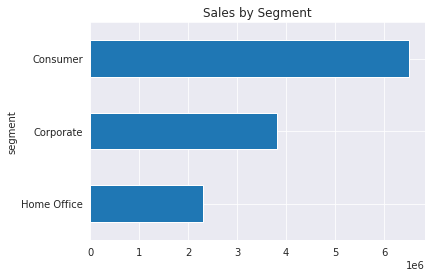

In [67]:
# Sales by Segment
# Vendas por Segmento

df.groupby('segment')['sales'].sum().sort_values(ascending=True).plot.barh();
plt.title("Sales by Segment") 
plt.show()

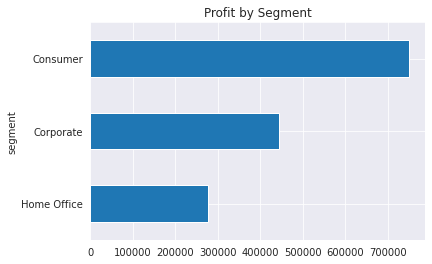

In [68]:
# Profit by Segment
# Lucros por Segmento

df.groupby('segment')['profit'].sum().sort_values(ascending=True).plot.barh();
plt.title("Profit by Segment") 
plt.show()

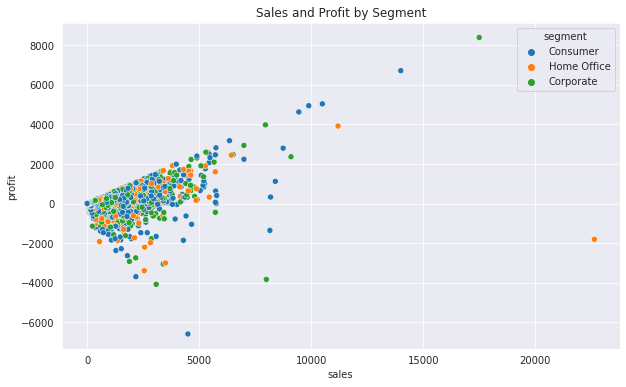

In [69]:
# Sales and Profit by Segment
# Vendas e Lucros por Segmento

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df, hue='segment',x='sales',y='profit')
plt.title("Sales and Profit by Segment") 
plt.show()

In [70]:
# Create dataframe for products
# Criar dataframe para produtos

df_profitability = df[['product_name', 'sales', 'profit']]
df_prof_prod=pd.DataFrame(df_profitability.groupby('product_name')['sales'].sum())
df_prof_prod['profit']=pd.DataFrame(df_profitability.groupby('product_name')['profit'].sum())
df_prof_prod['% Profitability']=df_prof_prod['profit']/df_prof_prod['sales'] * 100
df_prof_prod.sort_values(by='% Profitability', axis=0, ascending=False, inplace=True)

df_prof_prod

,sales,profit,% Profitability
product_name,,,
Xerox 20,6,3.1104,51.840000
Avery 475,265,133.2000,50.264151
Canon imageCLASS MF7460 Monochrome Digital Laser Multifunction Copier,3992,1995.9900,49.999749
Xerox 1890,245,122.3500,49.938776
Tops Green Bar Computer Printout Paper,343,171.2900,49.938776
...,...,...,...
"Chromcraft Coffee Table, Fully Assembled",1226,-1960.6960,-159.926264
Euro Pro Shark Stick Mini Vacuum,171,-325.6332,-190.428772
"Bush Westfield Collection Bookcases, Dark Cherry Finish, Fully Assembled",91,-190.8522,-209.727692


In [71]:
# Products with the Highest and Worst Profitability
# Produtos com Maiores e Piores Lucratividades

df_prof_prod = df_prof_prod['% Profitability'].sort_values(ascending=False)
print("Products with the Highest Profitability (%):", (df_prof_prod.head(3)), '\n')
print("Products with the Worst Profitability (%):", (df_prof_prod.tail(3)))

Products with the Highest Profitability (%): product_name
Xerox 20                                                                 51.840000
Avery 475                                                                50.264151
Canon imageCLASS MF7460 Monochrome Digital Laser Multifunction Copier    49.999749
Name: % Profitability, dtype: float64 

Products with the Worst Profitability (%): product_name
Bush Westfield Collection Bookcases, Dark Cherry Finish, Fully Assembled   -209.727692
Eureka Disposable Bags for Sanitaire Vibra Groomer I Upright Vac           -223.300000
Chromcraft Training Table, Adjustable Height                               -230.884211
Name: % Profitability, dtype: float64


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>13  |  Time Series</div></b>

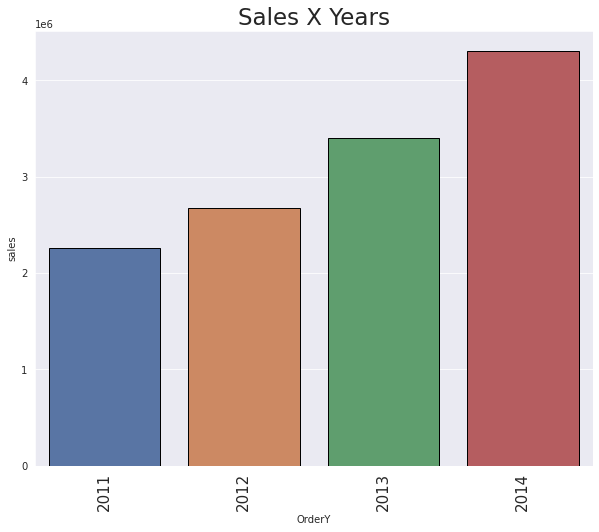

In [72]:
plt.figure(figsize=(10,8))
sns.set_style('darkgrid')
sns.barplot(x='OrderY', y='sales', data=df.groupby('OrderY').sum().sort_values('sales', ascending=False).reset_index(), ci=None, palette='deep',linewidth=1,edgecolor='black')
plt.title('Sales X Years', fontsize=23)
plt.xticks(fontsize=15, rotation=90)
plt.show()

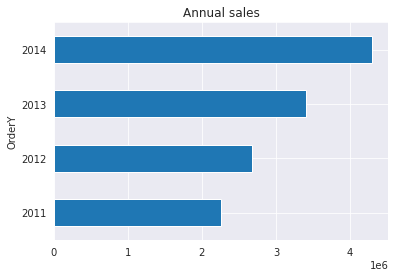

In [73]:
# Annual sales
# Vendas anuais

df.groupby('OrderY')['sales'].sum().plot.barh();
plt.title("Annual sales") 
plt.show()


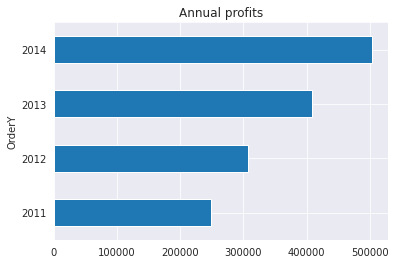

In [74]:
# Annual profits
# Lucros anuais

df.groupby('OrderY')['profit'].sum().plot.barh();
plt.title("Annual profits") 
plt.show()

## Analyze:

**Both Sales and profits are growing yearly.**

**Tanto as Vendas como os lucros estão crescendo anualmente.**

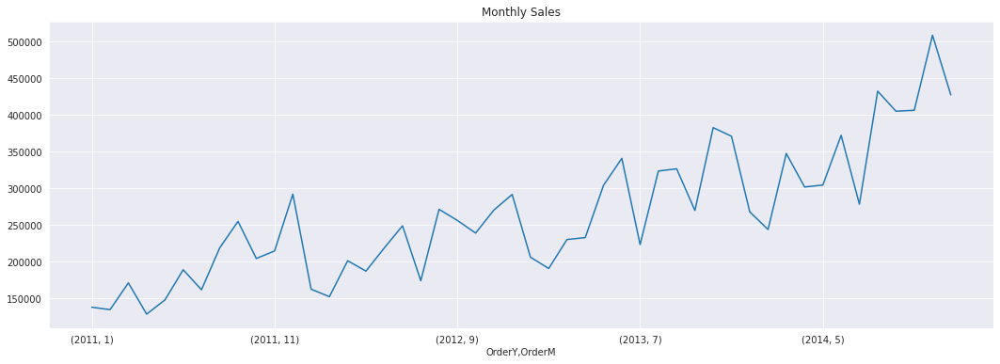

In [75]:
# Monthly Sales
# Vendas Mensais

plt.figure(figsize=(18,6))
df.groupby(['OrderY','OrderM'])['sales'].sum().plot();
plt.title("Monthly Sales") 
plt.show()


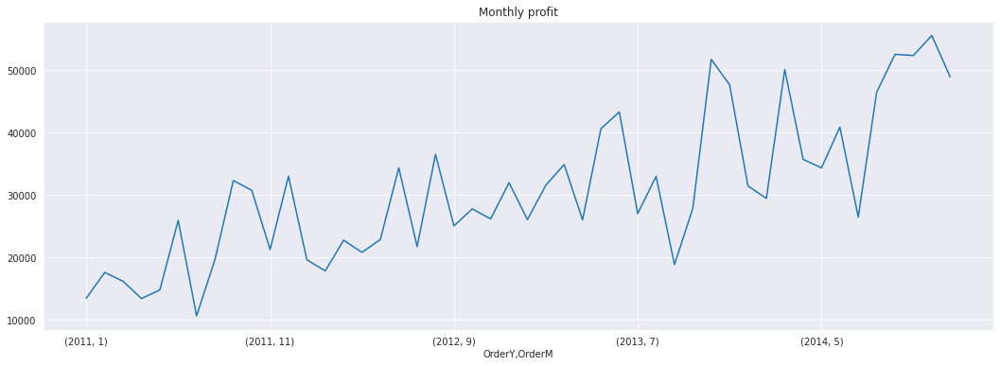

In [76]:
# Monthly profit
# Lucros mensais

plt.figure(figsize=(18,6))
df.groupby(['OrderY','OrderM'])['profit'].sum().plot();
plt.title("Monthly profit") 
plt.show()

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>14  |  Order Structure</div></b>

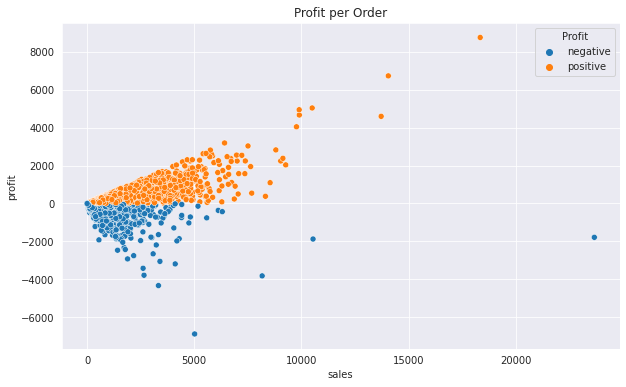

In [77]:
# Profit per Order
# Lucro por Ordem

df_ord=pd.DataFrame(df.groupby('order_id')['sales'].sum())
df_ord['profit']=pd.DataFrame(df.groupby('order_id')['profit'].sum())

def type(ex):
    if ex <0:
        return 'negative'
    else:
        return 'positive'

df_ord.loc[:,'Profit']=df_ord.loc[:,'profit'].apply(type)

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df_ord, hue='Profit',x='sales',y='profit')
plt.title("Profit per Order")
plt.show()

In [78]:
df_ord['Profit'].value_counts()

positive    18911
negative     6124
Name: Profit, dtype: int64


## Analyze:

**We found that 18911 orders have positive profit and 6124 orders have negative profit.**

**Verificamos que 18911 ordens tem lucro positivo e 6124 ordens tem lucro negativo.**

In [79]:
# Orders with Largest Profits and Largest Losses
# Ordens com Maiores Lucros e com Maiores Prejuízos

df_ord_pro = df.groupby('order_id')['profit'].sum().sort_values(ascending=False)
print("Orders with Largest Profits:", (df_ord_pro.head(3)), '\n')
print("Orders with Largest Losses:", (df_ord_pro.tail(3)))

Orders with Largest Profits: order_id
CA-2013-118689    8762.3891
CA-2014-140151    6734.4720
CA-2014-166709    5039.9856
Name: profit, dtype: float64 

Orders with Largest Losses: order_id
US-2014-168116   -3825.3394
TU-2013-9400     -4337.1840
CA-2013-108196   -6892.3748
Name: profit, dtype: float64


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>15  |  Shipe Mode</div></b>

In [80]:
# Set figure size and style
plt.figure(figsize=(20, 20))
sns.set_style('darkgrid')
palette = sns.color_palette('deep', n_colors=6)

fig = px.pie(df,
             names='ship_mode',
             values='sales',
             title='sales X ship_mode',
             labels={'sales': 'ship_mode'},
             hole=0.3)


fig.update_traces(textposition='inside', textinfo='percent+label')
plt.tight_layout()

# Show the chart
fig.show()

<Figure size 1440x1440 with 0 Axes>

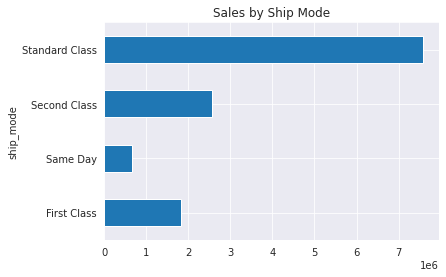

In [81]:
# Sales by Ship Mode
# Vendas por Ship Mode

df.groupby('ship_mode')['sales'].sum().plot.barh();
plt.title("Sales by Ship Mode") 
plt.show()

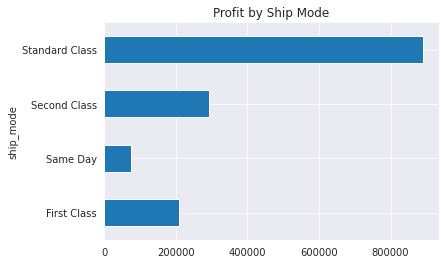

In [82]:
# Profit by Ship Mode
# Lucro por Ship Mode

df.groupby('ship_mode')['profit'].sum().plot.barh();
plt.title("Profit by Ship Mode") 
plt.show()

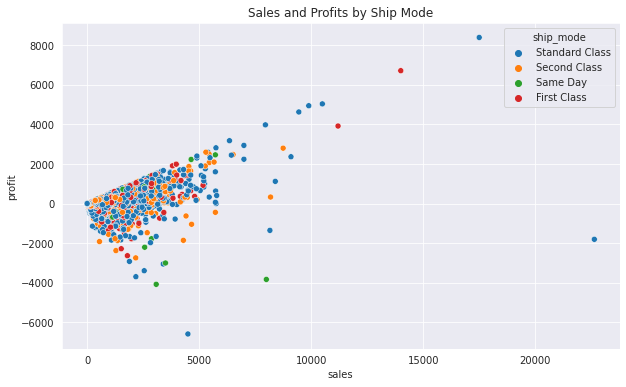

In [83]:
# Sales and Profits by Ship Mode
# Vendas e Lucros por Ship Mode

plt.figure(figsize=(10, 6)) 
sns.scatterplot(data=df, hue='ship_mode',x='sales',y='profit')
plt.title("Sales and Profits by Ship Mode") 
plt.show()

In [84]:
# Create dataframe for Ship Mode
# Criar dataframe para Ship Mode

df_ship = df[['ship_mode', 'sales', 'profit']]
df_ship_mode=pd.DataFrame(df_ship.groupby('ship_mode')['sales'].sum())
df_ship_mode['profit']=pd.DataFrame(df_ship.groupby('ship_mode')['profit'].sum())
df_ship_mode['% Profitability']=df_ship_mode['profit']/df_ship_mode['sales'] * 100
df_ship_mode


,sales,profit,% Profitability
ship_mode,,,
First Class,1831067,208104.67520,11.365214
Same Day,667202,76173.06780,11.416792
Second Class,2565747,294161.05708,11.464928
Standard Class,7578889,890596.02120,11.751010


## Analyze

**The highest volume of sales and profit is in ship_mode Standard Class**

**Lowest sales volume and profit is in ship_mode Same Day**

**Profitability is very similar for the 4 types of ship_mode**

## Analise

**O maior volume de vendas e lucros é no ship_mode Standard Class**

**O menor volume de vendas e lucros é no ship_mode Same Day**

**A lucratividade é muito parecida  para os 4 tipos de ship_mode** 

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>16  |  Final Analysis
</div></b>


#### First, let's present the highest in sales, profit, profitability, and loss for each attribute.
#### Primeiro vamos apresentar os maiores em vendas, lucro, lucratividade e prejuízo de cada atributo.

## Region

**- Sales/Vendas: 'Central', 'South'**

**- Profit/Lucros: 'Central', 'North'**

**- Profitability/Lucratividade: 'Canada', 'North Asia', 'North'**

**- Loss/Prejuízo: None/Nenhum**

## Country

**- Sales/Vendas: 'US', 'Australia'**

**- Profit/Lucros: 'US', 'China', 'India'**

**- Profitability/Lucratividade: 'Armenia', 'Mauritania', 'Eritrea'**

**- Loss/Prejuízo: 'Yemen', 'Kazakhstan', 'Turkministan'**

## States of US

**- Sales/Vendas: 'California', 'New York'**

**- Profit/Lucros: 'California', 'New York'**

**- Profitability/Lucratividade: 'D.C.', 'Delaware'**

**- Loss/Prejuízo: 'Colorado', 'Ohio'**

## Customer

**- Sales;Vendas: 'Tom Ashbrook', 'Tamara Chand'**

**- Profit/Lucros: 'Tamara Chand', 'Raymond Buch'**

**- Profitability/Lucratividade: 'Andy Reiter', 'Sanjit Chand'**

**- Loss/Prejuízo: 'David Bremer', 'Cindy Stewart'**

## Category

**- Sales/Vendas: 'Technology', 'Furniture'**

**- Profit/Lucros: 'Technology', 'Office Supplies'**

**- Profitability/Lucratividade: 'Technology', 'Office Supplies'**

**- Loss/Prejuízo: None/Nenhum**

## Sub-Category

**- Sales/Vendas: 'Phones', 'Copies'**

**- Profit/Lucros: 'Copies', 'Phones'**

**- Profitability/Lucratividade: 'Paper', 'Labels'**

**- Loss/Prejuízo: 'Tables'**

## Product

**- Sales/Vendas: 'Apple Smart Phone, Full Size', 'Cisco Smart Phone, Full Size'**

**- Profit/Lucros: 'Canon ImageCLASS 2200 Copier', 'Cisco Smart Phone, Full Size'**

**- Profitability/Lucratividade: 'Xerox 20', 'Avey 475'**

**- Loss/Prejuízo: 'Eureka D. Bags for Sanitaire', 'Chromcraft Training Table'**

## Ship Mode

**- Sales/Vendas: 'Standard Class', 'Second Class'**

**- Profit/Lucros: 'Standard Class', 'Second Class'**

**- Profitability/Lucratividade: All very similar / Todas muito parecidas**

**- Loss/Prejuízo: None / Nenhum**

## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>17  |  Strategy</div></b>

### Proposals to Increase Sales, Profits and Profitability, reducing or eliminating losses

### Focus efforts on all of the above attributes, giving priority to:
**- To those who have greater sales to increase in volume,**

**- To those who have greater profits and profitability to increase profits,**

**- To those who have loss to reduce or eliminate losses.**

### Propostas para Aumentar as Vendas, Lucros e Lucratividade, reduzindo ou eliminando os prejuízos

### Concentrar esforços em todos oa atributos acima, dando prioridade para:

**- Aos que tem maiores vendas para aumentar em volume,**

**- Aos que tem maiores lucros e lucratividade para aumentar os lucros,**

**- Aos que tem prejuízo para reduzir ou eliminar os prejuízos.**


## <b><div style='padding:15px;background-color:rgb(250,100,100);color:white;border-radius:2px;font-size:110%;text-align: center'>  If you liked it, please upvote. Thank you, very much.</div></b>
